<font size ="10" font color = "Blue"> **EXAM**

**Objective:** classify the tweets about Corona Virus as positive or negative; in the dataset there are 5 classes: `'Extremely Negative', 'Extremely Positive', 'Negative', 'Neutral', 'Positive'`, you will have to eliminate neutral and convert the rest into positive and negative.

1. Exploratory Data Analsis (EDA): look closely at you data, the text, the target, any null values, any imbalance, non-numerical data to be converted (in data and target)?, etc.
2. Split the train set into Training & Validation sets (0.75, 0.25), the test set is a separate file here. NB: if you do crossvalidation, you must not split the train into train & validation.
3. Clean Textual Data
4. Vectorize Texts (one hot encoder, tfidf, embeddings (word2vec with gensim, ELMO, BERT, GPT, etc.))
5. ML Classification model(s) or DL model or an ensemble of several ML/DL or both ML and DL models
6. Choose and justify the choice of the evaluation metric
7. Hyperparameter optimization (Cross validation - hyperopt - Gridsearch)
8. Evaluate on Test set
9. Use Lime to explain one text classification (from the test set)
10. Use Shapley to explain globally the text classification on the test set

**Comment all your steps: justify your choices, analyze the results (whether positive or negative), and finally conclude by suggesting improvements and making recommendations.**

You can use one notebook for all your work or seperate the EDA from the training and finally the testing and interpretability. <br>
You can also use .py scripts (classes/functions) and initialize/call them from the notebook. <br>

The goal is to check that you understood how does an NLP data science project starts. <br>
you will be evaluated on the methods used and **the comments and analysis** you will provide. <br>
Bad test performance will not influence your grade as long as you propose improvements and elaborate on the reasons you think might have influenced this bad results. <br>

**NB:**
- Imbalance can be fixed by Over/Under sampling and Data Augmentation.<br> Using Textual Data Augmentation techniques (libraries like textattack.augmentation, NLPAug, backtranslations, etc.,) would be a bonus if used.
- Another bonus is granted if you keep the problem a multi-class classification instead of a binary one; the classes woul be:`'Extremely Negative', 'Extremely Positive', 'Negative', 'Neutral', 'Positive'`

I have already started the EDA section for you.

# <font size ="5" font color = "Blue"> **Exploratory Data Analysis**

## Import libraries and load datasets

In [1]:
# Standard library imports
import os, sys, re
from zipfile import ZipFile
from collections import Counter

# External library imports
import numpy as np, pandas as pd, matplotlib.pyplot as plt, seaborn as sns, plotly.express as px
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
from wordcloud import WordCloud
from bs4 import BeautifulSoup
from transformers import BertTokenizerFast
from sklearn.pipeline import Pipeline
from sklearn import preprocessing
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer, TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import VotingClassifier, RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn import metrics
from scipy.sparse import hstack
import lightgbm as lgb
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.utils.multiclass import unique_labels
import tensorflow as tf
import keras
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout, LSTM, Embedding
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.initializers import Constant
from keras import layers
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import Conv1D, MaxPooling1D, GlobalMaxPooling1D, Input, LSTM
from tensorflow.keras.models import Model
from emoji import emoji_count
import lightgbm as lgb
from sklearn.pipeline import make_pipeline
from lime.lime_text import LimeTextExplainer
import shap
import nltk
from nltk.tokenize import word_tokenize, ToktokTokenizer
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.util import ngrams

# Downloading NLTK resources
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')


from bs4 import MarkupResemblesLocatorWarning
from pandas.core.generic import SettingWithCopyWarning
import warnings

# Filter warnings
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=MarkupResemblesLocatorWarning)
warnings.filterwarnings("ignore", category=SettingWithCopyWarning)
warnings.filterwarnings("ignore", category=FutureWarning, message="is_categorical_dtype is deprecated")

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Shiqing\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Shiqing\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Shiqing\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [2]:
train_df = pd.read_csv('Data/Corona_NLP_train.csv', encoding='latin')
test_df = pd.read_csv('Data/Corona_NLP_test.csv', encoding='latin')  

In [3]:
df_train = train_df[['OriginalTweet', 'Sentiment']]
df_test = test_df[['OriginalTweet', 'Sentiment']]

In [4]:
display(train_df.info())
display(test_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41157 entries, 0 to 41156
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   UserName       41157 non-null  int64 
 1   ScreenName     41157 non-null  int64 
 2   Location       32567 non-null  object
 3   TweetAt        41157 non-null  object
 4   OriginalTweet  41157 non-null  object
 5   Sentiment      41157 non-null  object
dtypes: int64(2), object(4)
memory usage: 1.9+ MB


None

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3798 entries, 0 to 3797
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   UserName       3798 non-null   int64 
 1   ScreenName     3798 non-null   int64 
 2   Location       2964 non-null   object
 3   TweetAt        3798 non-null   object
 4   OriginalTweet  3798 non-null   object
 5   Sentiment      3798 non-null   object
dtypes: int64(2), object(4)
memory usage: 178.2+ KB


None

In [5]:
def explore_dataset(df, dataset_type):
    print(f"{dataset_type} Dataset Exploration:")
    print("Head:\n", df.head())
    print("\nData Types:\n", df.dtypes)
    print("\nMissing Values:\n", df.isnull().sum())

    # Check balance
    print(f"\n{dataset_type} Dataset Balance Check:")
    print("Target Variable Distribution:\n", df['Sentiment'].value_counts())

explore_dataset(df_train, "Train")
explore_dataset(df_test, "Test")

Train Dataset Exploration:
Head:
                                        OriginalTweet           Sentiment
0  @MeNyrbie @Phil_Gahan @Chrisitv https://t.co/i...             Neutral
1  advice Talk to your neighbours family to excha...            Positive
2  Coronavirus Australia: Woolworths to give elde...            Positive
3  My food stock is not the only one which is emp...            Positive
4  Me, ready to go at supermarket during the #COV...  Extremely Negative

Data Types:
 OriginalTweet    object
Sentiment        object
dtype: object

Missing Values:
 OriginalTweet    0
Sentiment        0
dtype: int64

Train Dataset Balance Check:
Target Variable Distribution:
 Sentiment
Positive              11422
Negative               9917
Neutral                7713
Extremely Positive     6624
Extremely Negative     5481
Name: count, dtype: int64
Test Dataset Exploration:
Head:
                                        OriginalTweet           Sentiment
0  TRENDING: New Yorkers encounter empty

In [6]:
train_df["TweetAt"].nunique()

30

In [7]:
def plot_sentiment_distribution(df, title):
    sentiment_counts = df['Sentiment'].value_counts().reset_index()
    sentiment_counts.columns = ['Sentiment', 'Count']

    fig = px.bar(sentiment_counts, x='Sentiment', y='Count', text='Count',
                 title=title,
                 labels={'Sentiment': 'Sentiment', 'Count': 'Count'},
                 color='Sentiment',
                 )

    fig.update_layout(
        xaxis_title='Sentiment',
        yaxis_title='Count',
        hovermode="x",
        hoverlabel=dict(bgcolor="white", font_size=16),
    )

    fig.show()

plot_sentiment_distribution(df_train, 'Sentiment Distribution in Train Dataset')

plot_sentiment_distribution(df_test, 'Sentiment Distribution in Test Dataset')

<font size="5" font color = 'Green'>**Comments:**

<font size="3" font color = 'Green'>1. The decision not to use 'UserName', 'ScreenName', 'Location', and 'TweetAt' was based on several factors. Firstly, 'Location' had an abundance of missing values, rendering it less useful for analysis. Additionally, 'TweetAt' spanned only 30 days after the breakout of Covid-19, limiting its usefulness in observing significant variations in sentiment types. The impact of date will be addressed separately in subsequent analyses.

<font size="3" font color = 'Green'>2. Both the train and test datasets have no missing values in either the 'OriginalTweet' or 'Sentiment' columns.

<font size="3" font color = 'Green'>3. While the distribution of sentiment appears balanced at a glance, with Positive, Negative, and Neutral being the majority classes and Extremely Positive and Extremely Negative being the minority classes, it's important to acknowledge the potential for imbalance within each class based on the distribution of words. This will be discovered in depth in later part.

<font size="5" font color = 'Green'>**Overall observations:**

<font size="3" font color = 'Green'>1. The majority of tweets in both the train and test datasets are categorized as either positive or negative, with neutral tweets representing a moderate portion of the dataset. Extremely positive and extremely negative sentiments form a smaller portion of the dataset.

<font size="3" font color = 'Green'>2. There is a slight imbalance in the distribution of sentiment types, with positive sentiment being the most prevalent, followed by negative and neutral sentiments. This imbalance might indicate a skew in the dataset towards more positive or negative expressions regarding COVID-19.

<font size="3" font color = 'Green'>3. The presence of a considerable number of extreme positive and extreme negative tweets suggests a polarization of sentiment in the dataset, reflecting the diverse range of opinions, emotions, and attitudes towards the pandemic, including strong expressions of support, criticism, or concern.

## Check the frequency distribution of words in each type of Sentiment


Top 20 most common words in Distribution of Word Frequencies in Negative Tweets (Training):
#: 18245
the: 10191
to: 9230
.: 9042
:: 6964
,: 6655
and: 5486
of: 5472
https: 5437
?: 4695
in: 4579
a: 4436
@: 4283
coronavirus: 3366
for: 3143
is: 2936
are: 2802
I: 2301
on: 2244
prices: 2184

Top 20 most common words in Distribution of Word Frequencies in Positive Tweets (Training):
#: 22137
the: 11481
to: 10712
.: 10582
:: 8612
,: 8206
https: 6795
and: 6682
of: 5790
?: 5576
a: 5157
@: 5104
in: 5018
for: 4029
coronavirus: 3855
is: 3186
are: 3088
I: 2698
you: 2589
on: 2585

Top 20 most common words in Distribution of Word Frequencies in Neutral Tweets (Training):
#: 19807
?: 7362
:: 6877
the: 5645
https: 5554
.: 4677
to: 4643
,: 3495
@: 3357
coronavirus: 2965
of: 2854
and: 2819
in: 2702
a: 2357
for: 1680
is: 1468
on: 1391
are: 1241
store: 1216
I: 1187

Top 20 most common words in Distribution of Word Frequencies in Extremely Positive Tweets (Training):
#: 12579
to: 7458
.: 7377
the: 6824
,: 5

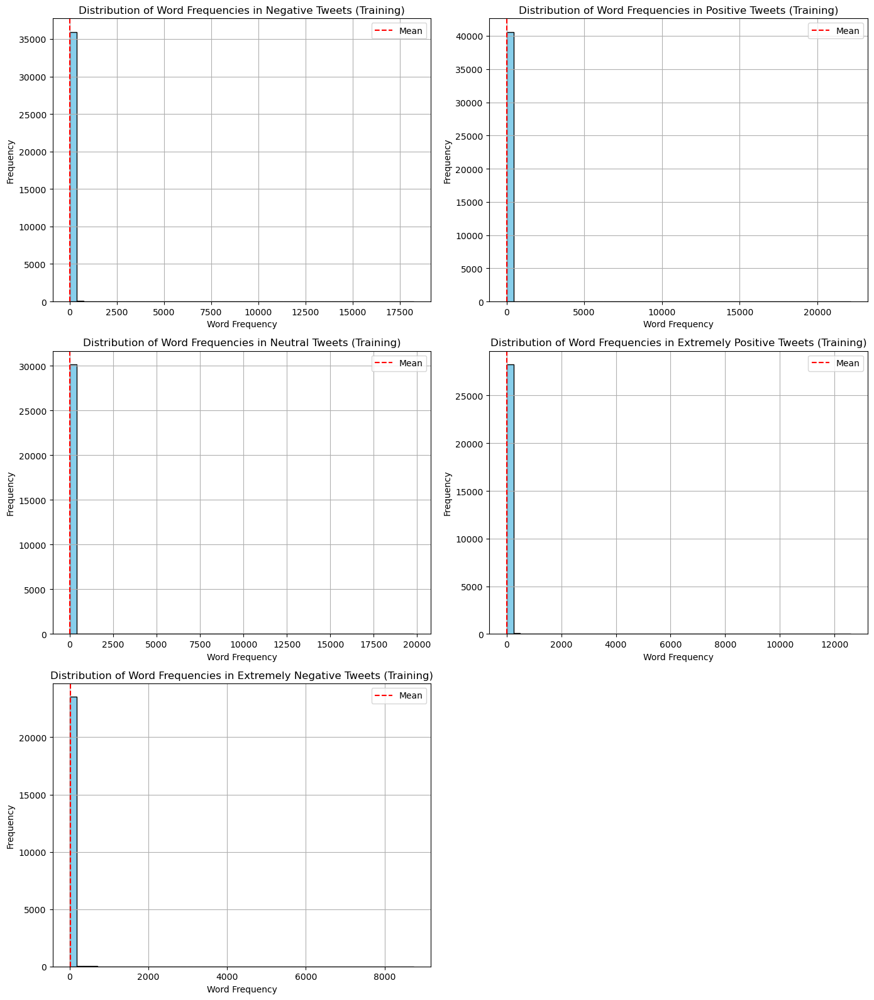

In [8]:
def plot_word_frequency(reviews, sentiment, title, subplot_index, top_n=20):
    # Tokenize words in each review
    tokens = [word_tokenize(review) for review, label in zip(reviews, sentiment)]

    # Flatten the list of tokens
    flat_tokens = [token for sublist in tokens for token in sublist]

    # Count the frequency of each word
    word_freq = Counter(flat_tokens)

    # Get the top N most common words
    top_words = word_freq.most_common(top_n)

    # Plot the histogram
    plt.subplot(3, 2, subplot_index)
    plt.hist(word_freq.values(), bins=50, color='skyblue', edgecolor='black')
    plt.axvline(x=sum(word_freq.values()) / len(word_freq), color='red', linestyle='--', label='Mean')
    plt.title(title)
    plt.xlabel('Word Frequency')
    plt.ylabel('Frequency')
    plt.legend()
    plt.grid(True)

    # Display the top N most common words
    print(f"\nTop {top_n} most common words in {title}:")
    for word, freq in top_words:
        print(f"{word}: {freq}")

# Create subplots for word frequency distributions and display top 10 most common words for each class
plt.figure(figsize=(14, 16))

plot_word_frequency(df_train[df_train['Sentiment'] == 'Negative']['OriginalTweet'],
                    df_train[df_train['Sentiment'] == 'Negative']['Sentiment'],
                    "Distribution of Word Frequencies in Negative Tweets (Training)", 1)

plot_word_frequency(df_train[df_train['Sentiment'] == 'Positive']['OriginalTweet'],
                    df_train[df_train['Sentiment'] == 'Positive']['Sentiment'],
                    "Distribution of Word Frequencies in Positive Tweets (Training)", 2)

plot_word_frequency(df_train[df_train['Sentiment'] == 'Neutral']['OriginalTweet'],
                    df_train[df_train['Sentiment'] == 'Neutral']['Sentiment'],
                    "Distribution of Word Frequencies in Neutral Tweets (Training)", 3)

plot_word_frequency(df_train[df_train['Sentiment'] == 'Extremely Positive']['OriginalTweet'],
                    df_train[df_train['Sentiment'] == 'Extremely Positive']['Sentiment'],
                    "Distribution of Word Frequencies in Extremely Positive Tweets (Training)", 4)

plot_word_frequency(df_train[df_train['Sentiment'] == 'Extremely Negative']['OriginalTweet'],
                    df_train[df_train['Sentiment'] == 'Extremely Negative']['Sentiment'],
                    "Distribution of Word Frequencies in Extremely Negative Tweets (Training)", 5)

plt.tight_layout()
plt.show()

<font size="5" font color = 'Green'>**Comments:**

<font size="3" font color = 'Green'>1. Upon initial examination of the most frequent words associated with each sentiment category, it's evident that there is a prevalence of special characters such as "@", "#", "!", as well as short words with a length of less than three characters like "on" and "I". Additionally, occurrences of URLs starting with "https" and common words such as "coronavirus" are noted. These elements are considered irrelevant for our analysis and will be removed during the Text Cleaning process.

<font size="3" font color = 'Green'>2. However, before proceeding with the removal of these elements, it's imperative to conduct an analysis specifically focusing on hashtags and mentions, as they are essential features within tweets.

## Hashtag and Mention at Analysis

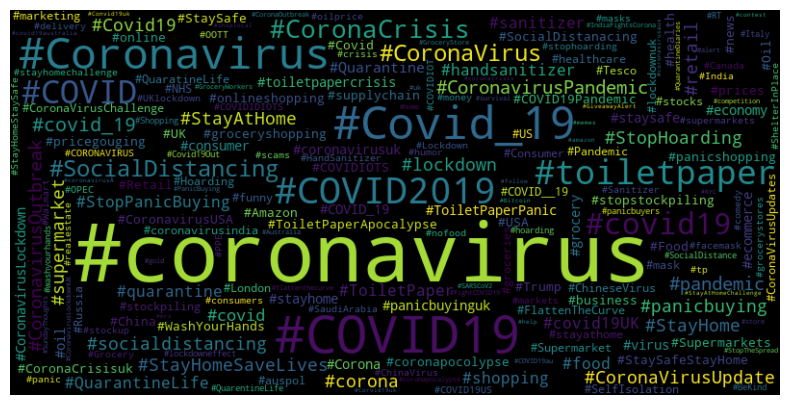

In [9]:
# Function to extract hashtags and their frequencies
def extract_hashtags(text_column):
    # Combine text from the 'TextColumn' into a single string
    combined_text = ' '.join(text_column)

    # Extract hashtags using regular expressions
    hashtags = re.findall(r'#\w+', combined_text)

    # Calculate hashtag frequencies
    hashtag_frequencies = Counter(hashtags)

    # Convert the Counter object to a DataFrame
    hashtag_df = pd.DataFrame(hashtag_frequencies.items(), columns=['Hashtag', 'Frequency'])

    return hashtag_df

hashtag_df = extract_hashtags(df_train['OriginalTweet'])

term_frequencies = dict(zip(hashtag_df['Hashtag'], hashtag_df['Frequency']))
# Generate a word cloud
wordcloud = WordCloud(width=800, height=400, background_color='black').generate_from_frequencies(term_frequencies)

# Display the word cloud using matplotlib
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

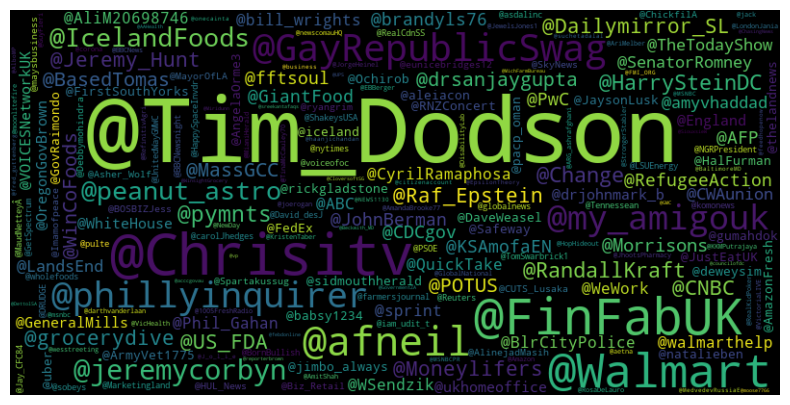

In [10]:
# Function to extract mentions and their frequencies
def extract_mentions(text_column):
    # Combine text from the 'TextColumn' into a single string
    combined_text = ' '.join(text_column)

    # Extract mentions using regular expressions
    mentions = re.findall(r'@\w+', combined_text)

    # Calculate mention frequencies
    mention_frequencies = Counter(mentions)

    # Convert the Counter object to a DataFrame
    mention_df = pd.DataFrame(mention_frequencies.items(), columns=['Mention', 'Frequency'])

    return mention_df

mentions_df = extract_mentions(df_train['OriginalTweet'])

term_frequencies = dict(zip(mentions_df['Mention'], hashtag_df['Frequency']))
# Generate a word cloud
wordcloud = WordCloud(width=800, height=400, background_color='black').generate_from_frequencies(term_frequencies)

# Display the word cloud using matplotlib
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

<font size="5" font color = 'Green'>**Comments:**

<font size="3" font color = 'Green'>1. From the word cloud picture of hashtags, we could identify trending topics, key themes, or specific events related to COVID-19. For example, popular hashtags like #coronavirus, #covid19, #toiletpaper, #socialdistancing, #vaccine, or #lockdown indicate the dominant topics of discussion.

<font size="3" font color = 'Green'>2. Mentions in tweets identify influential individuals, organizations, or experts. Combined with the analysis of hashtags, @Walmart shows that #toiletpaper, #shopping, @US_FDA is related to the public policies.

## Tweets Analysis based on Date

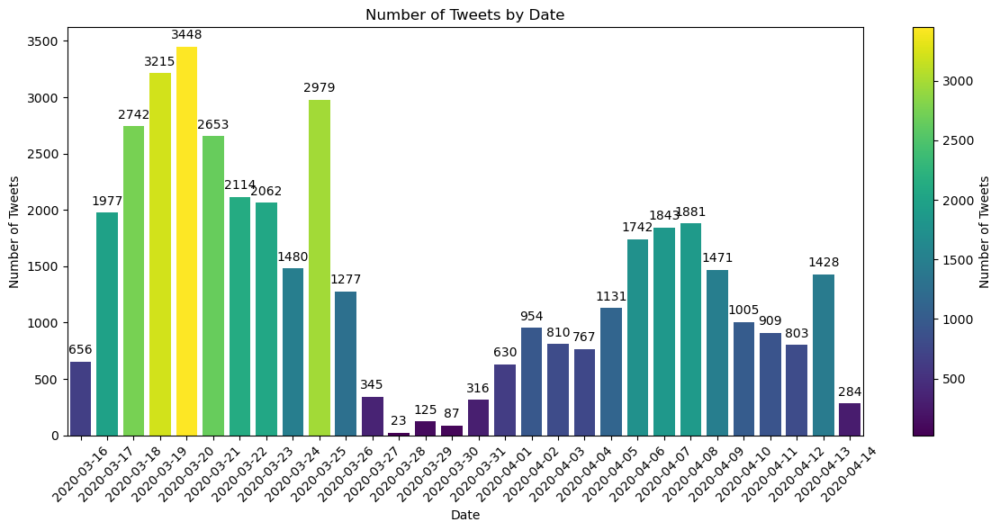

In [11]:
# Convert 'TweetAt' column to datetime format
train_df['TweetAt'] = pd.to_datetime(train_df['TweetAt'])

# Group DataFrame by date and count number of tweets for each date
tweets_per_date = train_df['TweetAt'].dt.date.value_counts().sort_index().reset_index()
tweets_per_date.columns = ['Date', 'Count']

# Plotting
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='Date', y='Count', data=tweets_per_date, palette='viridis')
plt.title('Number of Tweets by Date')
plt.xlabel('Date')
plt.ylabel('Number of Tweets')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

# Adding values on top of each bar
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'),
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 9),
                textcoords='offset points')

# Varying color of each bar based on its value
norm = Normalize(vmin=tweets_per_date['Count'].min(), vmax=tweets_per_date['Count'].max())
sm = ScalarMappable(norm=norm, cmap='viridis')
sm.set_array([])  # To prevent errors during plotting

for p, count in zip(ax.patches, tweets_per_date['Count']):
    color = sm.to_rgba(count)
    p.set_facecolor(color)

# Adding colorbar
cbar = plt.colorbar(sm, ax=ax, orientation='vertical')
cbar.set_label('Number of Tweets')

plt.tight_layout()
plt.show()

<font size="5" font color = 'Green'>**Comments:**

<font size="3" font color = 'Green'>The tweet volume during the second 15 days noticeably decreases compared to the first 15 days, exhibiting two peaks in each half. However, it's crucial to acknowledge that this dataset may not encompass all tweets from the specified period. As a result, analyzing tweets solely based on date may not yield reliable insights using this dataset.

# <font size ="5" font color = "Blue"> **Text Cleaning**

## Remove html, URLs, noisy, short words text, special characters, stop words, lemmatization

In [12]:
def denoise_text(text):
    # Convert to string if the input is not already a string
    text = str(text)

    # Replace underscores with spaces
    text = text.replace('_', ' ')

    # Remove URLs
    text = re.sub(r'https|http\S+', '', text)

    # Remove HTML tags
    soup = BeautifulSoup(text, "html.parser")
    text = soup.get_text(separator=' ')

    # Remove extra whitespaces
    text = re.sub(r'\s+', ' ', text).strip()

    # Remove short words (length less than 3)
    text = ' '.join(word for word in text.split() if len(word) >= 3)

    #remove \n and \r and lowercase
    text = text.replace('\r', '').replace('\n', ' ').replace('\n', ' ').lower()

    # Remove non-alphanumeric characters
    pattern = r'[^a-zA-z0-9\s]'
    text = re.sub(pattern, '', text)

    # Remove numbers
    text = re.sub(r'\d', '', text)

    # Remove usernames starting with '@'
    text = re.sub(r'@\S+', ' ', text)

    # Remove hashtags starting with '#'
    text = re.sub(r'#\S+', ' ', text)

    # Remove emojis using regular expression
    emoji_pattern = re.compile("["
                               u"\U0001F600-\U0001F64F"  # emoticons
                               u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                               u"\U0001F680-\U0001F6FF"  # transport & map symbols
                               u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                               "]+", flags=re.UNICODE)
    text = emoji_pattern.sub('', text)

    # Tokenize the text
    tokenizer = ToktokTokenizer()
    tokens = tokenizer.tokenize(text)

    # Set English stopwords
    stopword_list = set(stopwords.words('english'))

    # Remove stopwords
    filtered_tokens = [token for token in tokens if token.lower() not in stopword_list]

    # Lemmatize the text
    lemmatizer = WordNetLemmatizer()
    lemmatized_text = ' '.join([lemmatizer.lemmatize(word) for word in filtered_tokens])

    return lemmatized_text

df_train['text_clean'] = df_train['OriginalTweet'].apply(denoise_text)
df_test['text_clean'] = df_test['OriginalTweet'].apply(denoise_text)

## Barplot for word frequency

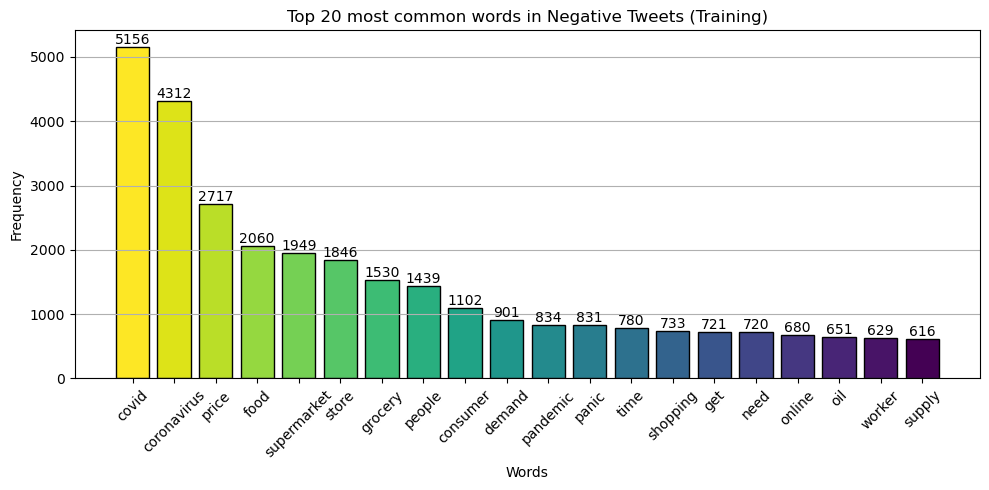

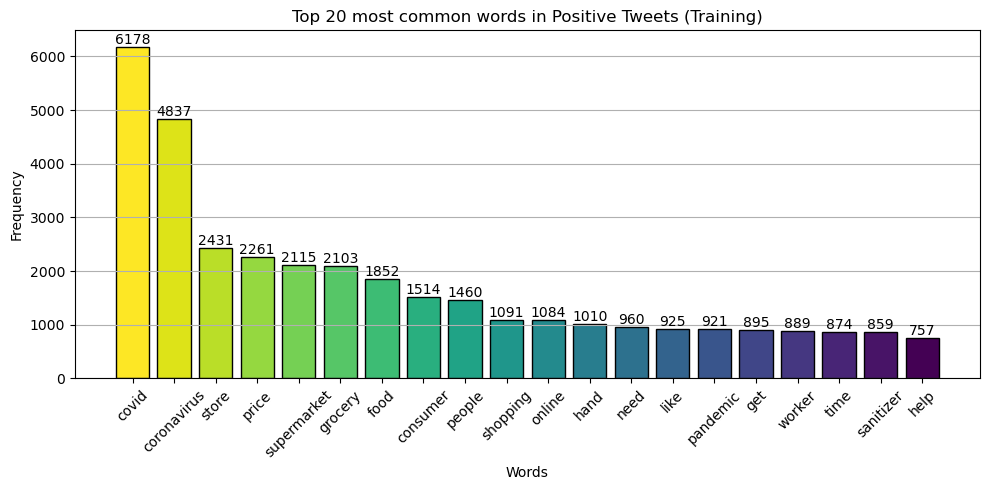

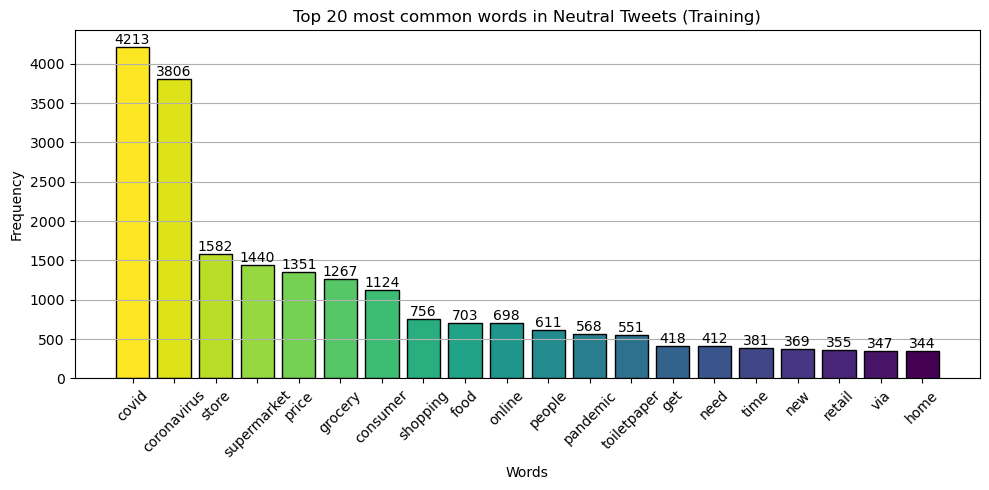

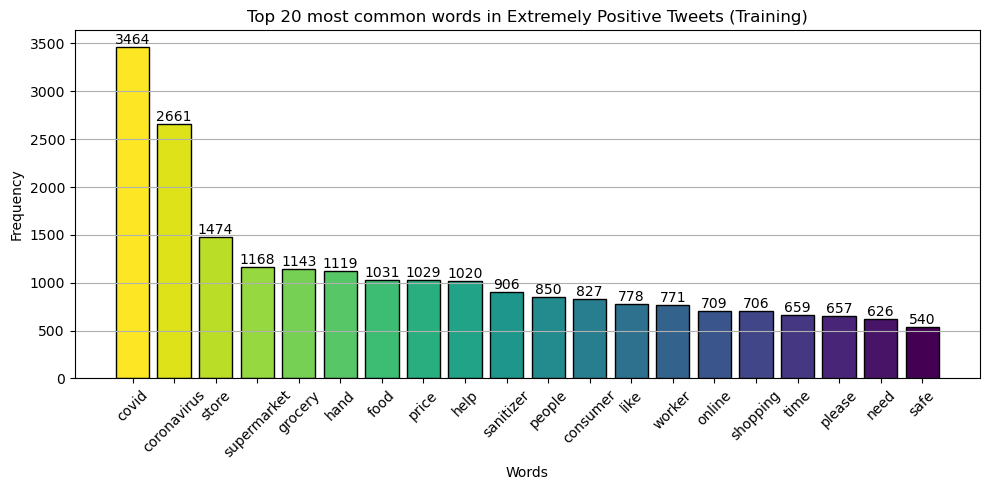

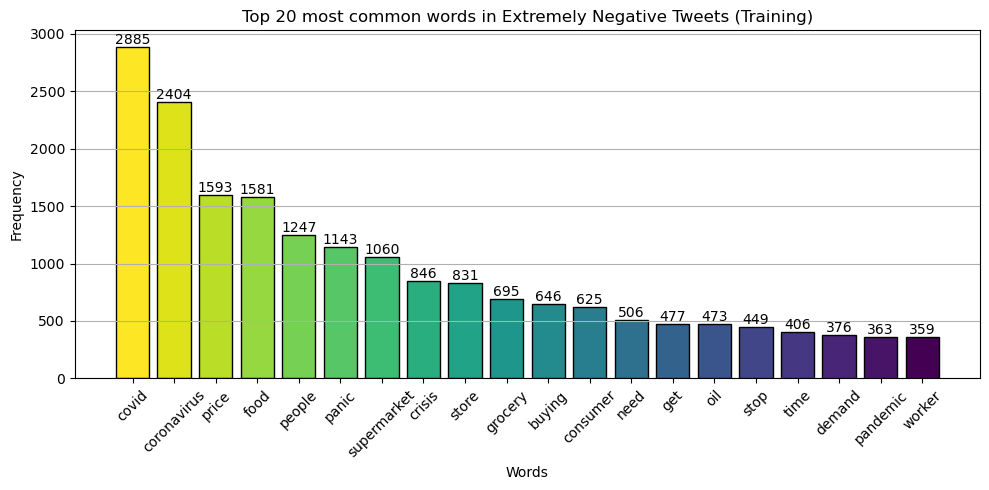

In [13]:
def plot_word_frequency(reviews, sentiment, title, top_n=20):
    # Tokenize words in each review
    tokens = [word_tokenize(review) for review, label in zip(reviews, sentiment)]

    # Flatten the list of tokens
    flat_tokens = [token for sublist in tokens for token in sublist]

    # Count the frequency of each word
    word_freq = Counter(flat_tokens)

    # Get the top N most common words
    top_words = word_freq.most_common(top_n)

    # Define a color map and reverse the order
    colors = plt.cm.viridis(np.linspace(0, 1, top_n))[::-1]

    # Plot the bar plot for top words
    plt.figure(figsize=(10, 5))
    bars = plt.bar([word for word, _ in top_words], [freq for _, freq in top_words], color=colors, edgecolor='black')
    plt.title(title)
    plt.xlabel('Words')
    plt.ylabel('Frequency')
    plt.xticks(rotation=45)
    plt.grid(axis='y')

    # Display the top N most common words
    for bar, (word, freq) in zip(bars, top_words):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1, str(freq), ha='center', va='bottom')

    plt.tight_layout()
    plt.show()

# Plot bar plots for top 10 most common words for each type of sentiment
plot_word_frequency(df_train[df_train['Sentiment'] == 'Negative']['text_clean'],
                    df_train[df_train['Sentiment'] == 'Negative']['Sentiment'],
                    "Top 20 most common words in Negative Tweets (Training)")

plot_word_frequency(df_train[df_train['Sentiment'] == 'Positive']['text_clean'],
                    df_train[df_train['Sentiment'] == 'Positive']['Sentiment'],
                    "Top 20 most common words in Positive Tweets (Training)")

plot_word_frequency(df_train[df_train['Sentiment'] == 'Neutral']['text_clean'],
                    df_train[df_train['Sentiment'] == 'Neutral']['Sentiment'],
                    "Top 20 most common words in Neutral Tweets (Training)")

plot_word_frequency(df_train[df_train['Sentiment'] == 'Extremely Positive']['text_clean'],
                    df_train[df_train['Sentiment'] == 'Extremely Positive']['Sentiment'],
                    "Top 20 most common words in Extremely Positive Tweets (Training)")

plot_word_frequency(df_train[df_train['Sentiment'] == 'Extremely Negative']['text_clean'],
                    df_train[df_train['Sentiment'] == 'Extremely Negative']['Sentiment'],
                    "Top 20 most common words in Extremely Negative Tweets (Training)")

<font size="5" font color = 'Green'>**Comments:**

<font size="3" font color = 'Green'>After cleaning the text, we observed that the most frequent words in each sentiment category include duplicates such as "food", "covid", "supermarket", etc. To address this, we removed these duplicates and then utilized Word Cloud and Bag of N grams techniques to visualize the most frequent words.

## Remove specific frequent useless words

In [14]:
def remove_specific_words(text):
    # Define words to remove
    words_to_remove = {"covid", "coronavirus", "pandemic", "panic", "time", "covid_", "going", "thank", "work", "due",
                       "buying", "need", "stop", "may", "maybe", "might", "please", "need", "help", "via", "get", "almost",
                       "lot", "many", "much", "make", "sure", "got", "well", "good", "great", "went", "dont", "still",
                       "thanks", "today", "keep",
                       "other", "others", "say", "day", "everyone", "amp", "one", "food", "there", "see", "sch", "store",
                      #  "oil", "sanitizer","toiletpaper",
                       "people", "consumer", "get", "u","hand", "like", "worker",  "go", "new", "retail", "help", "please",
                       "supermarket", "grocery", "price", "demand", "shopping",  "online", "crisis", "stock", "im", "buy"}

    # Tokenize the text
    tokens = word_tokenize(text)

    # Remove specific words
    filtered_tokens = [word for word in tokens if word.lower() not in words_to_remove]

    # Join the filtered tokens back into text
    processed_text = ' '.join(filtered_tokens)

    return processed_text

df_train['text_clean'] = df_train['text_clean'].apply(remove_specific_words)
df_test['text_clean'] = df_test['text_clean'].apply(remove_specific_words)

## Word Cloud

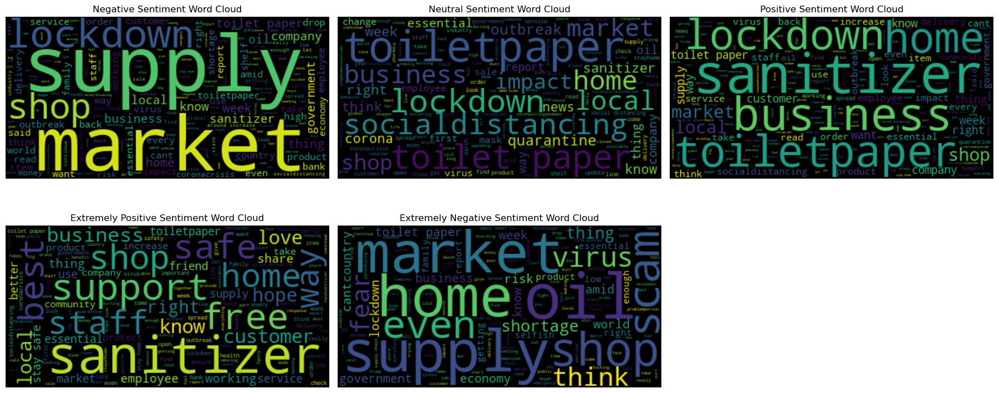

In [15]:
# Define sentiment labels and corresponding texts
sentiments = ['Negative', 'Neutral', 'Positive', 'Extremely Positive', 'Extremely Negative']
texts = [' '.join(df_train[df_train.Sentiment == sentiment].text_clean.tolist()) for sentiment in sentiments]

# Create subplots for word clouds
plt.figure(figsize=(18, 8))

for i, (sentiment, text) in enumerate(zip(sentiments, texts), 1):
    # Create WordCloud object
    wordcloud = WordCloud().generate(text)

    # Plot word cloud
    plt.subplot(2, 3, i)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'{sentiment} Sentiment Word Cloud')
    plt.axis('off')

# Show the subplots
plt.tight_layout()
plt.show()

## Bi-grams and Tri-grams

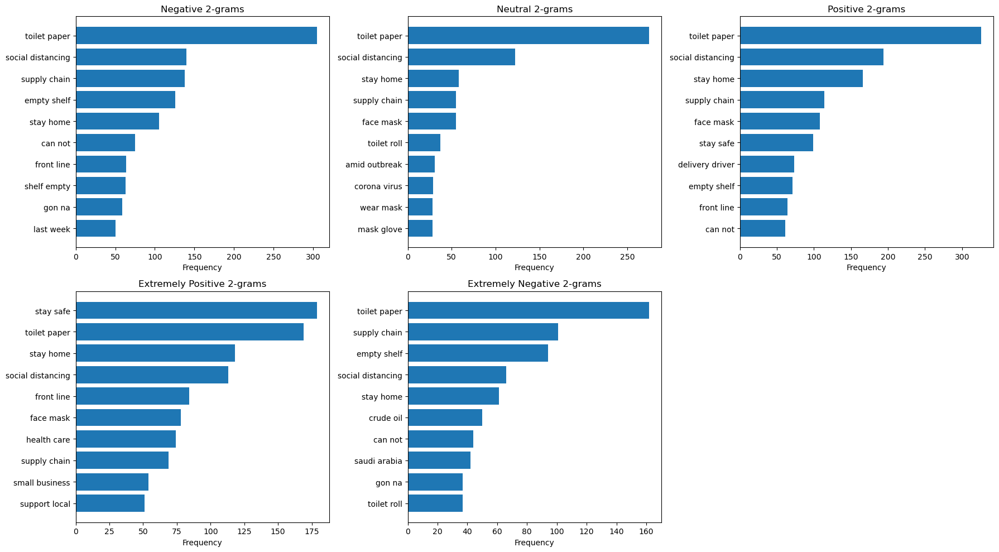

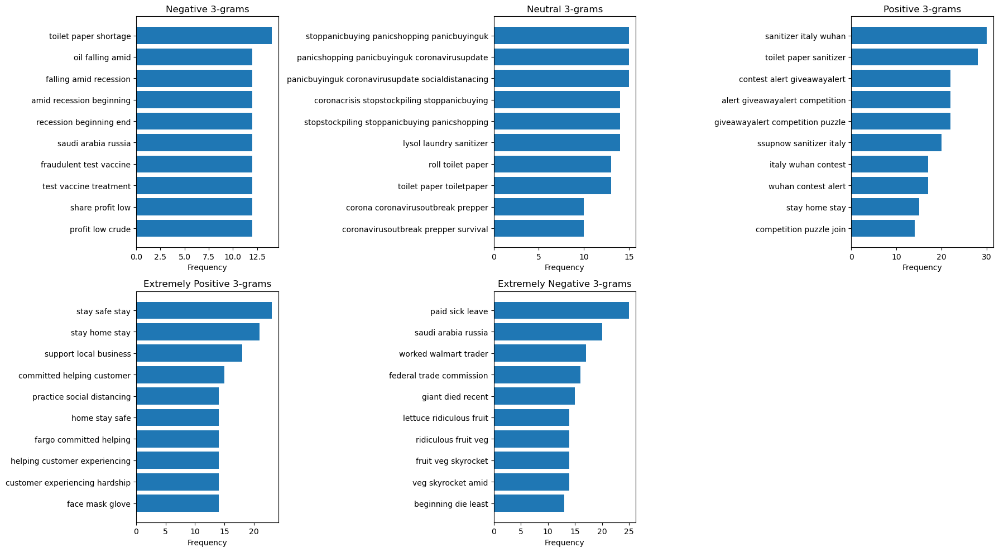

In [16]:
def plot_ngrams(sentiments, df_train, n=2, top_n=10):
    plt.figure(figsize=(18, 10))

    for i, sentiment in enumerate(sentiments, 1):
        # Tokenize words in each review for the specific sentiment
        reviews = df_train[df_train['Sentiment'] == sentiment]['text_clean']
        tokens = [word_tokenize(review) for review in reviews]

        # Generate n-grams
        n_grams = [ngram for sublist in tokens for ngram in list(ngrams(sublist, n))]

        # Count the frequency of each n-gram
        n_grams_freq = Counter(n_grams)

        # Select top N most common n-grams and reverse the order
        top_n_grams = n_grams_freq.most_common(top_n)[::-1]

        # Plot bar plot for n-grams
        plt.subplot(2, 3, i)
        x, y = zip(*top_n_grams)
        plt.barh(range(len(x)), y, tick_label=[' '.join(gram) for gram in x])
        plt.title(f'{sentiment} {n}-grams')
        plt.xlabel('Frequency')

    plt.tight_layout()
    plt.show()

# Define sentiment labels
sentiments = ['Negative', 'Neutral', 'Positive', 'Extremely Positive', 'Extremely Negative']

# Plot bi-grams bar plots for each sentiment type
plot_ngrams(sentiments, df_train, n=2)

# Plot tri-grams bar plots for each sentiment type
plot_ngrams(sentiments, df_train, n=3)

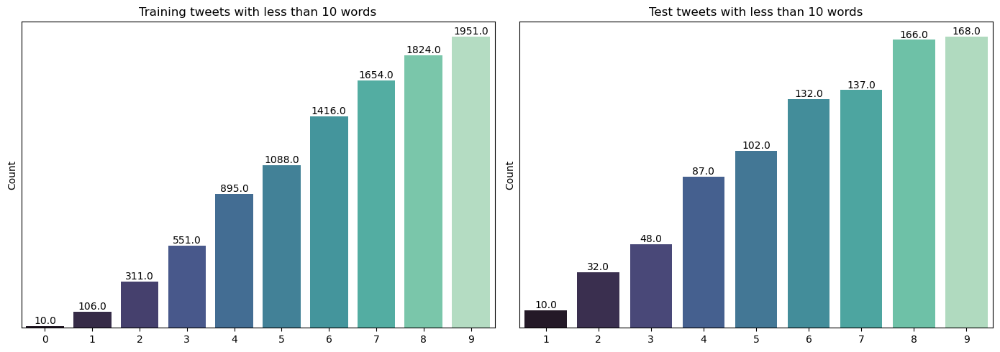

In [17]:
def get_text_length(text_series):
    return [len(text.split()) for text in text_series]

def plot_text_length_distribution(ax, text_length, title):
    sns.countplot(x='text_len', data=text_length[text_length['text_len'] < 10], palette='mako', ax=ax)
    ax.set_title(title)
    ax.set_yticks([])
    for p in ax.patches:
        ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                    textcoords='offset points')
    ax.set_ylabel('Count')
    ax.set_xlabel('')

# Compute text length for training and test sets
df_train['text_len'] = get_text_length(df_train['text_clean'])
df_test['text_len'] = get_text_length(df_test['text_clean'])

# Create a figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Plot text length distribution for training set
plot_text_length_distribution(axes[0], df_train, 'Training tweets with less than 10 words')

# Plot text length distribution for test set
plot_text_length_distribution(axes[1], df_test, 'Test tweets with less than 10 words')

plt.tight_layout()
plt.show()

<font size="5" font color = 'Green'>**Comments:**

<font size="3" font color = 'Green'>**There are lots of cleaned tweets less than 5 words due to the cleaning performed before. This means that they are empty tweets contained only mentions, hashtags and links, which have been removed, we will drop them.**

In [18]:
print(f" Orginal training dataframe shape: {df_train.shape}")
print(f" Orginal test dataframe shape: {df_test.shape}")
df_train = df_train[df_train['text_len'] > 5]
df_test = df_test[df_test['text_len'] > 5]
print(f" New training dataframe shape: {df_train.shape}")
print(f" New test dataframe shape: {df_test.shape}")

 Orginal training dataframe shape: (41157, 4)
 Orginal test dataframe shape: (3798, 4)
 New training dataframe shape: (38196, 4)
 New test dataframe shape: (3519, 4)


# <font size ="5" font color = "Blue"> **Text Vectorization**

## Contextual Embeddings using BERT

In [19]:
def tokenize_texts(texts, tokenizer, max_length=512):
    token_lens = []
    for txt in texts:
        tokens = tokenizer.encode(txt, max_length=max_length, truncation=True)
        token_lens.append(len(tokens))
    return token_lens

# Initialize the tokenizer
tokenizer = BertTokenizerFast.from_pretrained('bert-base-uncased')

# Tokenize training data
df_train['token_lens'] = tokenize_texts(df_train['text_clean'].values, tokenizer)

# Find maximum tokenized sentence length
max_len_train = np.max(df_train['token_lens'])
print(f"MAX TOKENIZED SENTENCE LENGTH (Training): {max_len_train}")

# Tokenize test data
df_test['token_lens'] = tokenize_texts(df_test['text_clean'].values, tokenizer)

# Find maximum tokenized sentence length for test data
max_len_test = np.max(df_test['token_lens'])
print(f"MAX TOKENIZED SENTENCE LENGTH (Test): {max_len_test}")

# Print indices and texts of sentences with token length > 80
print("Indices and texts of sentences with token length > 80 (Training):")
for i, txt, token_len in zip(df_train.index, df_train['text_clean'], df_train['token_lens']):
    if token_len > 80:
        print(f"INDEX: {i}, TEXT: {txt}")

print("Indices and texts of sentences with token length > 80 (Test):")
for i, txt, token_len in zip(df_test.index, df_test['text_clean'], df_test['token_lens']):
    if token_len > 80:
        print(f"INDEX: {i}, TEXT: {txt}")

# Shuffle the datasets
df_train = df_train.sample(frac=1).reset_index(drop=True)
df_test = df_test.sample(frac=1).reset_index(drop=True)

MAX TOKENIZED SENTENCE LENGTH (Training): 96
MAX TOKENIZED SENTENCE LENGTH (Test): 89
Indices and texts of sentences with token length > 80 (Training):
INDEX: 1638, TEXT: zsah policie proti spekulantm roukami mj popud hejtman steckho kraje spoluprci policiecz podle krizovho zkona zajistil tm tisrouek firmy kter mla dodat zdravotnkm ale posledn chvli snaila navyovat cenu spolutozvladneme
INDEX: 11213, TEXT: keine wertgegenstnde fahrzeug lassen diesen tipp sollte man besten immer nicht nur zeiten von corona befolgen wrselen wurde die scheibe eines pkw eingeschlagen mehrere rollen klopapier gestohlen tcodruciwjvvs
INDEX: 13691, TEXT: hoy aplaudo segunda familia aplaudoanuestrosheroes aquellos con los que compartido tantas noches trabajo tanta alegra que como siempre dan todo por bien comunidad presidente ivanduque por ellos tambin cuarentenanacionalya cuidemosalosquecuidan tcoeduhbotz
INDEX: 14593, TEXT: na wer war denn werk gestern nachmittag konnten anwohnerinnen de stadtteil praunheim 

## Convert the target into a categorical

In [20]:
df_train['sentiment'] = df_train['Sentiment'].map({'Extremely Negative': 0, 'Negative': 1, 'Neutral': 2, 'Positive': 3, 'Extremely Positive': 4})
df_test['sentiment'] = df_test['Sentiment'].map({'Extremely Negative': 0, 'Negative': 1, 'Neutral': 2, 'Positive': 3, 'Extremely Positive': 4})
display(df_train['Sentiment'].value_counts())
display(df_test['Sentiment'].value_counts())

Sentiment
Positive              10753
Negative               9340
Extremely Positive     6465
Neutral                6317
Extremely Negative     5321
Name: count, dtype: int64

Sentiment
Negative              993
Positive              888
Extremely Positive    586
Extremely Negative    581
Neutral               471
Name: count, dtype: int64

<font size="5" font color = 'Green'>**Comments:**
    
<font size="3" font color = 'Green'>1. Using BERT for contextual embeddings prior to modeling is crucial for our sentiment analysis task. BERT generates word representations that capture the contextual nuances of a sentence, enabling a deeper understanding of the text. To prepare the data for BERT model training, we tokenized the text inputs and managed sequences exceeding the maximum token length. Additionally, we shuffled the data to ensure randomness in both training and testing sets.

<font size="3" font color = 'Green'>2. To maintain consistency and avoid any potential bias from the order of sentiments, we converted the target labels from Extremely Negative to Extremely Positive. This ensures that the explainability and interpretability of the model predictions remain unaffected by the inherent order of sentiment categories.

# <font size ="5" font color = "Blue"> **Split Dataset**

In [21]:
X = df_train['text_clean'].values
y = df_train['sentiment'].values
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.25, stratify=y, random_state=42)
X_test = df_test['text_clean'].values
y_test = df_test['sentiment'].values

<font size="5" font color = 'Green'>**Comments:**

<font size="3" font color = 'Green'>**The reasons why split the dataset before applying encoding:**

<font size="3" font color = 'Green'>1. Prevents Data Leakage: This prevents information from the testing set inadvertently influences the training process, leading to overly optimistic performance estimates.

<font size="3" font color = 'Green'>2. Reflects Real-World Scenario: By splitting the dataset before encoding, we are more close to real-world scenario, leading to more reliable model evaluations.

<font size="3" font color = 'Green'>3. Facilitates Model Evaluation: Splitting the dataset beforehand allows to evaluate the model's performance on unseen data, providing a better estimate of its generalization ability.

<font size="3" font color = 'Red'>Searched related materials and double checked by ChatGPT.

# <font size ="5" font color = "Blue"> **ML & DL doing Multi Classification Task**


## Naive Bayes Classifier

In [22]:
# Define the pipeline
pipeline = Pipeline([
    ('vect', CountVectorizer()),
    ('tfidf', TfidfTransformer()),
    ('clf', MultinomialNB())
])

# Train the model
pipeline.fit(X_train, y_train)

# Evaluate on the validation set
y_pred_valid = pipeline.predict(X_valid)
print("Validation Set Classification Report:")
print(classification_report(y_valid, y_pred_valid))

# Test the model on the test set
y_pred_test = pipeline.predict(X_test)
print("Test Set Classification Report:")
print(classification_report(y_test, y_pred_test))

Validation Set Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.02      0.04      1331
           1       0.39      0.40      0.39      2335
           2       0.71      0.02      0.04      1579
           3       0.34      0.89      0.49      2688
           4       0.83      0.03      0.06      1616

    accuracy                           0.36      9549
   macro avg       0.62      0.27      0.21      9549
weighted avg       0.56      0.36      0.26      9549

Test Set Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.02      0.03       581
           1       0.39      0.36      0.37       993
           2       0.67      0.01      0.02       471
           3       0.31      0.89      0.46       888
           4       0.87      0.03      0.07       586

    accuracy                           0.33      3519
   macro avg       0.63      0.26      0.19      3519
weighte

In [23]:
# Define the base classifiers for ensemble learning
clf1 = MultinomialNB()
clf2 = RandomForestClassifier()
clf3 = GradientBoostingClassifier()
clf4 = AdaBoostClassifier()
clf5 = LogisticRegression()

# Define the ensemble classifier using VotingClassifier # 'hard' for majority voting
ensemble_clf = VotingClassifier(estimators=[
    ('nb', clf1),
    ('rf', clf2),
    ('gb', clf3),
    ('ada', clf4),
    ('lr', clf5)
], voting='hard')  

# Define the pipeline with the ensemble classifier
pipeline = Pipeline([
    ('vect', CountVectorizer()),
    ('tfidf', TfidfTransformer()),
    ('clf', ensemble_clf)  # Use the ensemble classifier here
])

# Train the model
pipeline.fit(X_train, y_train)

# Evaluate on the validation set
y_pred_valid = pipeline.predict(X_valid)
print("Validation Set Classification Report:")
print(classification_report(y_valid, y_pred_valid))

# Test the model on the test set
y_pred_test = pipeline.predict(X_test)
print("Test Set Classification Report:")
print(classification_report(y_test, y_pred_test))

C:\Users\Shiqing\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.



Validation Set Classification Report:
              precision    recall  f1-score   support

           0       0.63      0.35      0.45      1331
           1       0.46      0.41      0.43      2335
           2       0.52      0.17      0.25      1579
           3       0.37      0.75      0.50      2688
           4       0.67      0.36      0.46      1616

    accuracy                           0.45      9549
   macro avg       0.53      0.41      0.42      9549
weighted avg       0.50      0.45      0.43      9549

Test Set Classification Report:
              precision    recall  f1-score   support

           0       0.56      0.34      0.42       581
           1       0.44      0.36      0.39       993
           2       0.51      0.11      0.18       471
           3       0.33      0.73      0.46       888
           4       0.64      0.34      0.45       586

    accuracy                           0.41      3519
   macro avg       0.50      0.37      0.38      3519
weighte

<font size="5" font color = 'Green'>**Comments:**

<font size="3" font color = 'Green'>The performance of the model using only one classifier is unsatisfactory, indicating a low accuracy. To address this, we employ ensemble learning, combining predictions from five diverse classifiers. Despite this effort, the accuracy remains below 50%. Therefore, we opt to explore deep learning methods to enhance the model's performance further.

In [24]:
# Convert text data and labels to lists
train_texts = df_train.text_clean.apply(lambda x: str(x)).tolist()
test_texts = df_test.text_clean.apply(lambda x: str(x)).tolist()
train_labels = df_train.sentiment.tolist()
test_labels = df_test.sentiment.tolist()

# Define parameters
MAX_NUM_WORDS = 20000
MAX_LEN = 1000
EMBEDDING_DIM = 100

# Tokenize the text data
tokenizer = Tokenizer(num_words=MAX_NUM_WORDS)
tokenizer.fit_on_texts(train_texts)
train_sequences = tokenizer.texts_to_sequences(train_texts) # Convert text to a sequence of word indexes
test_sequences = tokenizer.texts_to_sequences(test_texts)
word_index = tokenizer.word_index
print('Found %s unique tokens.' % len(word_index))

# Load pre-trained GloVe embeddings
BASE_DIR = 'Data'
GLOVE_DIR = os.path.join(BASE_DIR, 'glove.6B')
embeddings_index = {}
with open(os.path.join(GLOVE_DIR, 'glove.6B.100d.txt'), encoding='utf8') as f:
    for line in f:
        values = line.split()
        word = values[0]
        coefs = np.asarray(values[1:], dtype='float32')
        embeddings_index[word] = coefs

print('Found %s word vectors in Glove embeddings.' % len(embeddings_index))

# Prepare embedding matrix
num_words = min(MAX_NUM_WORDS, len(word_index)) + 1
embedding_matrix = np.zeros((num_words, EMBEDDING_DIM))
for word, i in word_index.items():
    if i > MAX_NUM_WORDS:
        continue
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector

# Create embedding layer with pre-trained GloVe embeddings
embedding_layer = Embedding(num_words,
                            EMBEDDING_DIM,
                            embeddings_initializer=Constant(embedding_matrix),
                            input_length=MAX_LEN,
                            trainable=True)
print("Preparation of embedding matrix is done.")

Found 74533 unique tokens.
Found 400000 word vectors in Glove embeddings.
Preparation of embedding matrix is done.


<font size="5" font color = 'Green'>**Comments:**

<font size="3" font color = 'Green'>The reasons we use GloVe word embeddings for our sentiment analysis tasks on Twitter are:

<font size="3" font color = 'Green'> 1. GloVe embeddings are trained on large corpora of text data, including Twitter data by capturing the semantic similarity between words based on their co-occurrence statistics in the corpus. This helps in understanding the context of tweets, which often contain informal language, slang, and abbreviations.

<font size="3" font color = 'Green'> 2. GloVe embeddings can be used as part of pre-processing pipeline to transform the text data into dense vector representations. These embeddings can then be used as input features for deep learning models such as recurrent neural networks (RNNs), convolutional neural networks (CNNs), or transformers. This makes them more memory-efficient and faster to compute. 

## 1D CNN Model

In [25]:
# Define your train and test data
MAX_SEQUENCE_LENGTH = 100
NUM_CLASSES = 5

# Tokenize text data and convert to sequences
tokenizer = Tokenizer(num_words=MAX_NUM_WORDS)
tokenizer.fit_on_texts(train_texts + test_texts)  # Fit tokenizer on both train and test data
train_sequences = tokenizer.texts_to_sequences(train_texts)
test_sequences = tokenizer.texts_to_sequences(test_texts)

# Pad sequences to ensure they all have the same length
X_train = pad_sequences(train_sequences, maxlen=MAX_SEQUENCE_LENGTH)
X_test = pad_sequences(test_sequences, maxlen=MAX_SEQUENCE_LENGTH)

# Convert labels to categorical if needed
num_classes = 5
y_train = to_categorical(np.array(train_labels) - 1, num_classes=num_classes)
y_test = to_categorical(np.array(test_labels) - 1, num_classes=num_classes)

# Reshape input data to include a channel dimension
X_train = np.expand_dims(X_train, axis=-1)
X_test = np.expand_dims(X_test, axis=-1)

# Define a 1D CNN model
cnnmodel = Sequential()
cnnmodel.add(Embedding(MAX_NUM_WORDS, 128, input_length=MAX_SEQUENCE_LENGTH))
cnnmodel.add(Conv1D(128, 5, activation='relu'))
cnnmodel.add(MaxPooling1D(2))
cnnmodel.add(Conv1D(128, 5, activation='relu'))
cnnmodel.add(GlobalMaxPooling1D())
cnnmodel.add(Dense(128, activation='relu'))
cnnmodel.add(Dense(NUM_CLASSES, activation='softmax'))

cnnmodel.compile(loss='categorical_crossentropy',
              optimizer='rmsprop',
              metrics=['acc'])

# Split the data into training and validation sets
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.25, stratify=y_train, random_state=42)

# Train the model
cnnmodel.fit(X_train, y_train,
          batch_size=128,
          epochs=1,
          validation_data=(X_valid, y_valid))

# Evaluate on test set
score, acc = cnnmodel.evaluate(X_test, y_test)
print('Test accuracy with CNN Model: {:.2f}%'.format(acc * 100))

110/110 [==============================] - 1s 10ms/step - loss: 1.3286 - acc: 0.4140
Test accuracy with CNN Model: 41.40%


<font size="5" font color = 'Green'>**Comments:**

<font size="3" font color = 'Green'>1. The accuracy achieved by employing an embedding layer with randomly initialized weights, Embedding(MAX_NUM_WORDS, 128), closely resembles that obtained through ensemble learning techniques, around 50.0%. So we gonna try other deep learning method, LSTM instead. 
    
<font size="3" font color = 'Green'>2. Simple CNN models with randomly initialized embeddings can perform reasonably for text classification tasks, but LSTM models have inherent advantages in handling sequential data and capturing semantic relationships, which often result in better performance, especially when dealing with more complex datasets.

## LSTM Model with training your own embedding

In [26]:
rnnmodel = Sequential()
rnnmodel.add(Embedding(MAX_NUM_WORDS, 128))
rnnmodel.add(LSTM(128, dropout=0.2, recurrent_dropout=0.2))
rnnmodel.add(Dense(5, activation='sigmoid'))
rnnmodel.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

rnnmodel.fit(X_train, y_train,
          batch_size=32,
          epochs=1,
          validation_data=(X_valid, y_valid))
score, acc = rnnmodel.evaluate(X_test, y_test, batch_size=32)
print('Test accuracy with LSTM Model: {:.2f}%'.format(acc * 100))

110/110 [==============================] - 3s 27ms/step - loss: 1.1497 - accuracy: 0.5291
Test accuracy with LSTM Model: 52.91%


<font size="5" font color = 'Green'>**Comments:**

<font size="3" font color = 'Green'>The overall accuracy increase to average 58.0% using LSTM Model with embedding. The performance improves because the following reasons:

<font size="3" font color = 'Green'>1. Sequential Data Handling: LSTM models are designed to remember information over long sequences and are parameter-efficient compared to CNN models, especially when dealing with long sequences, which can be crucial for understanding the context and meaning of sentences, and reduce the computational cost and potential overfitting without the need for extensive padding.

<font size="3" font color = 'Green'>2. Semantic Understanding: LSTM models can learn intricate patterns and dependencies in the data as well as relevant features from the text, which can lead to better representations and, consequently, better performance.

<font size="3" font color = 'Green'>3. Generalization: LSTM models are known for their ability to generalize well to unseen data, making them suitable for various natural language processing tasks. They can learn complex relationships from the training data and apply them to new instances, which can lead to better overall performance.

## Transformer Model

Implement a Transformer block as a layer

In [27]:
class TransformerBlock(layers.Layer):
    def __init__(self, embed_dim, num_heads, ff_dim, rate=0.1):
        super().__init__()
        self.att = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.ffn = keras.Sequential(
            [layers.Dense(ff_dim, activation="relu"), layers.Dense(embed_dim),]
        )
        self.layernorm1 = layers.LayerNormalization(epsilon=1e-6)
        self.layernorm2 = layers.LayerNormalization(epsilon=1e-6)
        self.dropout1 = layers.Dropout(rate)
        self.dropout2 = layers.Dropout(rate)

    def call(self, inputs):
        attn_output = self.att(inputs, inputs)
        attn_output = self.dropout1(attn_output)
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        ffn_output = self.dropout2(ffn_output)
        return self.layernorm2(out1 + ffn_output)

Implement embedding layer

In [28]:
class TokenAndPositionEmbedding(layers.Layer):
    def __init__(self, maxlen, vocab_size, embed_dim):
        super().__init__()
        self.token_emb = layers.Embedding(input_dim=vocab_size, output_dim=embed_dim)
        self.pos_emb = layers.Embedding(input_dim=maxlen, output_dim=embed_dim)

    def call(self, x):
        # maxlen = ops.shape(x)[-1]
        maxlen = tf.shape(x)[-1]
        # positions = ops.arange(start=0, stop=maxlen, step=1)
        positions = tf.range(start=0, limit=maxlen, delta=1)
        positions = self.pos_emb(positions)
        x = self.token_emb(x)
        return x + positions

Create classifier model using transformer layer

In [29]:
embed_dim = 32  # Embedding size for each token
num_heads = 2  # Number of attention heads
ff_dim = 32  # Hidden layer size in feed forward network inside transformer

inputs = tf.keras.Input(shape=(MAX_SEQUENCE_LENGTH,))
embedding_layer = TokenAndPositionEmbedding(MAX_SEQUENCE_LENGTH, MAX_NUM_WORDS, embed_dim)
x = embedding_layer(inputs)
transformer_block = TransformerBlock(embed_dim, num_heads, ff_dim)
x = transformer_block(x)
x = layers.GlobalAveragePooling1D()(x)
x = layers.Dropout(0.1)(x)
x = layers.Dense(20, activation="relu")(x)
x = layers.Dropout(0.1)(x)
outputs = layers.Dense(5, activation="softmax")(x)

model = keras.Model(inputs=inputs, outputs=outputs)

Train and Evaluate

In [30]:
MAX_SEQUENCE_LENGTH = 100
NUM_CLASSES = 5

# Tokenize text data and convert to sequences
tokenizer = Tokenizer(num_words=MAX_NUM_WORDS)
tokenizer.fit_on_texts(train_texts + test_texts)  # Fit tokenizer on both train and test data
train_sequences = tokenizer.texts_to_sequences(train_texts)
test_sequences = tokenizer.texts_to_sequences(test_texts)

# Pad sequences to ensure they all have the same length
X_train = pad_sequences(train_sequences, maxlen=MAX_SEQUENCE_LENGTH)
X_test = pad_sequences(test_sequences, maxlen=MAX_SEQUENCE_LENGTH)

# Convert labels to categorical if needed
num_classes = 5
y_train = to_categorical(np.array(train_labels) - 1, num_classes=num_classes)
y_test = to_categorical(np.array(test_labels) - 1, num_classes=num_classes)

# Reshape input data to include a channel dimension
X_train = np.expand_dims(X_train, axis=-1)
X_test = np.expand_dims(X_test, axis=-1)

model.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])
history = model.fit(
    X_train, y_train, batch_size=32, epochs=2, validation_data=(X_valid, y_valid)
)
#Evaluate on test set:
score, acc = model.evaluate(X_test, y_test)
print('Test accuracy with Transformer based model: {:.2f}%'.format(acc * 100))

Epoch 1/2
1194/1194 [==============================] - 57s 44ms/step - loss: 1.3799 - accuracy: 0.3921 - val_loss: 1.0188 - val_accuracy: 0.6035
Epoch 2/2
110/110 [==============================] - 1s 13ms/step - loss: 1.1220 - accuracy: 0.5632
Test accuracy with Transformer based model: 56.32%


In [31]:
from keras.models import Sequential
from keras.layers import Embedding, Conv1D, MaxPooling1D, GlobalMaxPooling1D, Dense, Flatten
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split

# Define a function to create the model
def create_model():
    model = Sequential()
    model.add(Embedding(MAX_NUM_WORDS, 128, input_length=MAX_SEQUENCE_LENGTH))
    model.add(Conv1D(128, 5, activation='relu'))
    model.add(MaxPooling1D(2))
    model.add(Conv1D(128, 5, activation='relu'))
    model.add(GlobalMaxPooling1D())
    model.add(Dense(128, activation='relu'))
    model.add(Dense(NUM_CLASSES, activation='softmax'))
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Define parameters
NUM_MODELS = 3  # Number of models in the ensemble

# Initialize list to store models
ensemble_models = []

# Train multiple instances of the model
for i in range(NUM_MODELS):
    print(f"Training Model {i+1}/{NUM_MODELS}...")
    model = create_model()
    model.fit(X_train, y_train, batch_size=32, epochs=2, validation_data=(X_valid, y_valid), verbose=0)
    ensemble_models.append(model)

# Combine predictions of ensemble models
y_pred_probs = np.zeros_like(y_test)
for model in ensemble_models:
    y_pred_probs += model.predict(X_test)
y_pred_probs /= NUM_MODELS

# Convert probabilities to class labels
y_pred_labels = np.argmax(y_pred_probs, axis=1)
y_true_labels = np.argmax(y_test, axis=1)

# Calculate ensemble accuracy
ensemble_accuracy = np.mean(y_pred_labels == y_true_labels)
print('Test accuracy with Ensemble Model: {:.2f}%'.format(ensemble_accuracy * 100))

Training Model 1/3...
Training Model 2/3...
Training Model 3/3...
110/110 [==============================] - 1s 11ms/step
Test accuracy with Ensemble Model: 57.66%


<font size="5" font color = 'Green'>**Comments:**

<font size="3" font color = 'Green'>1. The overall accuracy increase to around 60.0% by several times of running code after applying ensemble learning on the Transformer Model. In our case, Transformers performs a little bit higher than LSTM or CNN models. These because the following reasons.

<font size="3" font color = 'Green'>2. Attention Mechanism: Transformers utilize self-attention mechanisms enables better capturing of long-range dependencies and relationships within the data especially in tasks with long sequences.

<font size="3" font color = 'Green'>3. Parameter Efficiency: Transformers typically require fewer parameters compared to LSTM or CNN models for capturing long-range dependencies allowing them to better handle large-scale datasets and complex tasks without overfitting.

<font size="3" font color = 'Green'>4. Transfer Learning: Transformer-based models have already learned rich representations of language by being pretrained on large text corpora using unsupervised learning objectives.

# <font size ="5" font color = "Blue"> **LIME**

## Employing Local Interpretable Model-agnostic Explanations (LIME)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004751 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4660
[LightGBM] [Info] Number of data points in the train set: 2357, number of used features: 318
[LightGBM] [Info] Start training from score -1.791335
[LightGBM] [Info] Start training from score -1.299000
[LightGBM] [Info] Start training from score -2.009403
[LightGBM] [Info] Start training from score -1.366550
[LightGBM] [Info] Start training from score -1.763730
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

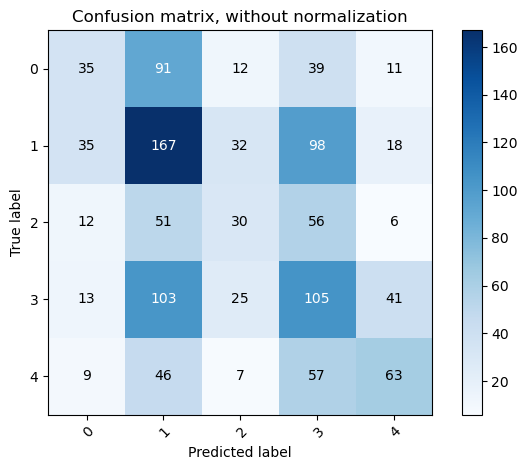

In [32]:
# Set a fixed random seed
random_seed = 42

# Extract features and target variables
X = df_test.drop(['OriginalTweet','Sentiment', 'text_len', 'token_lens','sentiment'], axis=1).copy()
y = df_test['sentiment']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=random_seed)
X_train_nlp = X_train['text_clean']
X_test_nlp = X_test['text_clean']

# Initialize a Tfidf vectorizer with lowercase set to false
vectorizer = TfidfVectorizer(lowercase=False)

# Fit the vectorizer to the train data and transform the train and test data
X_train_text_fit = vectorizer.fit_transform(X_train['text_clean'])
X_test_text_fit = vectorizer.transform(X_test['text_clean'])

# Combine TF-IDF text features with non-text features
X_train_combined = hstack([X_train_text_fit, X_train.drop('text_clean', axis=1)])
X_test_combined = hstack([X_test_text_fit, X_test.drop('text_clean', axis=1)])

# Define the classifier
lgb_mdl = lgb.LGBMClassifier(max_depth=13, learning_rate=0.05, n_estimators=100, objective='multiclass', random_state=random_seed)

# Fit the classifier on the training data
fitted_lgb_mdl = lgb_mdl.fit(X_train_combined, y_train)

# Make predictions on both the training and testing sets
y_train_lgb_pred = fitted_lgb_mdl.predict(X_train_combined)
y_test_lgb_pred = fitted_lgb_mdl.predict(X_test_combined)

# Calculate the accuracy of the model's predictions on both the training and testing sets
train_accuracy = metrics.accuracy_score(y_train_lgb_pred, y_train)
test_accuracy = metrics.accuracy_score(y_test_lgb_pred, y_test)
print('Accuracy Train:\t', train_accuracy, '\tAccuracy Test:\t', test_accuracy)

# Print classification report
print('Classification report:\n', classification_report(y_test_lgb_pred, y_test))

# Plot confusion matrix
def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
    classes = classes[unique_labels(y_true, y_pred)]
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax

# Plot non-normalized confusion matrix
plot_confusion_matrix(y_test, y_test_lgb_pred, classes=np.unique(y_test), title='Confusion matrix, without normalization')

plt.show()

In [64]:
X_test_nlp

2457    csharp let wait hasnt peaked usa yet show last...
70      episode chopped tuna cotton candy soy milk entree
358     email sainsburys ceo regarding supporting fami...
325     isnt tweet reached living extra supply hopeful...
2208    son inlaw told seeing toiletpaper offerup roll...
                              ...                        
2147    calgary lineup said wife thing feel christmas ...
1102    give respect outbreak imagine working cash reg...
3075    let ask pharmacy open early limit first hour v...
2499    retailer warned hoarding toilet paper cleaning...
1725    jeremyvineon drchrissmith drsarahjarvis diagno...
Name: text_clean, Length: 1162, dtype: object

In [65]:
# Get the indices that exist in X_test_nlp
existing_indices = sorted(X_test_nlp.index)

# Print the indices in ascending order
print("Indices that exist in X_test_nlp in ascending order:")
print(existing_indices)

Indices that exist in X_test_nlp in ascending order:
[0, 7, 12, 14, 17, 22, 25, 26, 29, 30, 31, 32, 33, 43, 44, 45, 48, 51, 52, 56, 58, 59, 61, 63, 67, 69, 70, 73, 76, 80, 87, 88, 93, 96, 100, 102, 104, 108, 109, 111, 120, 123, 124, 134, 135, 139, 141, 144, 149, 152, 157, 162, 166, 168, 170, 173, 174, 175, 176, 177, 178, 179, 183, 184, 187, 188, 192, 194, 195, 196, 199, 203, 208, 210, 211, 212, 214, 217, 218, 219, 220, 221, 226, 227, 229, 231, 233, 238, 239, 240, 246, 247, 251, 254, 256, 257, 258, 259, 263, 266, 270, 272, 274, 276, 278, 279, 282, 283, 288, 289, 291, 295, 296, 298, 299, 309, 313, 314, 315, 318, 321, 322, 324, 325, 328, 331, 332, 343, 346, 350, 351, 354, 358, 361, 365, 366, 367, 368, 370, 371, 376, 381, 387, 393, 402, 407, 408, 410, 411, 414, 415, 416, 420, 422, 423, 430, 432, 433, 435, 436, 438, 439, 442, 443, 449, 450, 456, 457, 460, 461, 462, 463, 464, 465, 468, 471, 472, 478, 479, 485, 486, 490, 495, 498, 501, 505, 506, 507, 509, 511, 518, 521, 522, 527, 528, 532, 53

## Local Interpretation for a single prediction at a time using LimeTextExplainer

In [58]:
# Initialize a pipeline consisting of the vectorizer fitted previously and the lightgbm model trained previously
lgb_pipeline = make_pipeline(vectorizer, lgb_mdl)
lime_lgb_explainer = LimeTextExplainer(class_names=['Extremely Negative', 'Negative', 'Neutral', 'Positive', 'Extremely Positive'])

X_test_nlp[X_test_nlp.index==17].values[0]
display(df_test[df_test['text_clean']== X_test_nlp[X_test_nlp.index==17].values[0]])
lime_lgb_explainer.explain_instance(X_test_nlp[X_test_nlp.index==17].values[0],
                                    lgb_pipeline.predict_proba, num_features=4).show_in_notebook(text=True)

,OriginalTweet,Sentiment,text_clean,text_len,token_lens,sentiment
17,"Food bank expects heightened demand, change in...",Negative,bank expects heightened change distribution me...,9,17,1


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


In [68]:
X_test_nlp[X_test_nlp.index==70].values[0]
display(df_test[df_test['text_clean']== X_test_nlp[X_test_nlp.index==70].values[0]])
lime_lgb_explainer.explain_instance(X_test_nlp[X_test_nlp.index==70].values[0],
                                    lgb_pipeline.predict_proba, num_features=4).show_in_notebook(text=True)

,OriginalTweet,Sentiment,text_clean,text_len,token_lens,sentiment
70,Going to the grocery store is like being on a ...,Positive,episode chopped tuna cotton candy soy milk entree,8,11,3


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


In [71]:
X_test_nlp[X_test_nlp.index==1706].values[0]
display(df_test[df_test['text_clean']== X_test_nlp[X_test_nlp.index==1706].values[0]])
lime_lgb_explainer.explain_instance(X_test_nlp[X_test_nlp.index==1706].values[0],
                                    lgb_pipeline.predict_proba, num_features=4).show_in_notebook(text=True)

,OriginalTweet,Sentiment,text_clean,text_len,token_lens,sentiment
1706,Boomers: WE HAVE TO STOCK UP ON FOOD AND TOILE...,Positive,boomer toilet paper millennials gen creates sp...,9,15,3


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


In [67]:
X_test_nlp[X_test_nlp.index==2401].values[0]
display(df_test[df_test['text_clean']== X_test_nlp[X_test_nlp.index==2401].values[0]])
lime_lgb_explainer.explain_instance(X_test_nlp[X_test_nlp.index==2401].values[0],
                                    lgb_pipeline.predict_proba, num_features=4).show_in_notebook(text=True)

,OriginalTweet,Sentiment,text_clean,text_len,token_lens,sentiment
2401,Stock make sure to have a few bottles of #Quas...,Positive,bottle quash natural sanitizer spray desk home...,25,42,3


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


<font size="5" font color = 'Green'>**Comments:**
    
<font size="3" font color = 'Green'> 1. The model employing LIME and LightGBM demonstrates an ability to predict sentiment types with a degree of accuracy by discerning words with negative or positive connotations. In the first two plots, LIME accurately predicts the sentiment as reflected in the actual label.

<font size="3" font color = 'Green'> 2. LIME also made predictions of tweets as Negative that were actually labeled as Positive, vice versa. The decision boundary between positive and negative sentiments may be highly nonlinear or complex, posing a challenge for LIME to accurately approximate the behavior of the underlying model in the local neighborhood of the observation. In the third LIME plot, the tweet might convey a positive sentiment, yet the presence of the word "toilet paper" led to a prediction of Negative sentiment.
    
<font size="3" font color = 'Green'> 3. However, the model does not perform well when distinguish bewteen Extremely Negative and Negative, or distinguish bewteen Extremely Positive and Postive. The features used for prediction are not sufficiently informative or discriminative for these fine-grained distinctions, LIME may not be able to capture the subtle differences between them. For example, the fourth one, the tweet talked about sanitizer etc. were available which was labeled as Positive was predicted by LIME as Extremely Positive.

# <font size ="5" font color = "Blue"> **Shapley**

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


  0%|          | 0/50 [00:00<?, ?it/s]

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^m

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^m

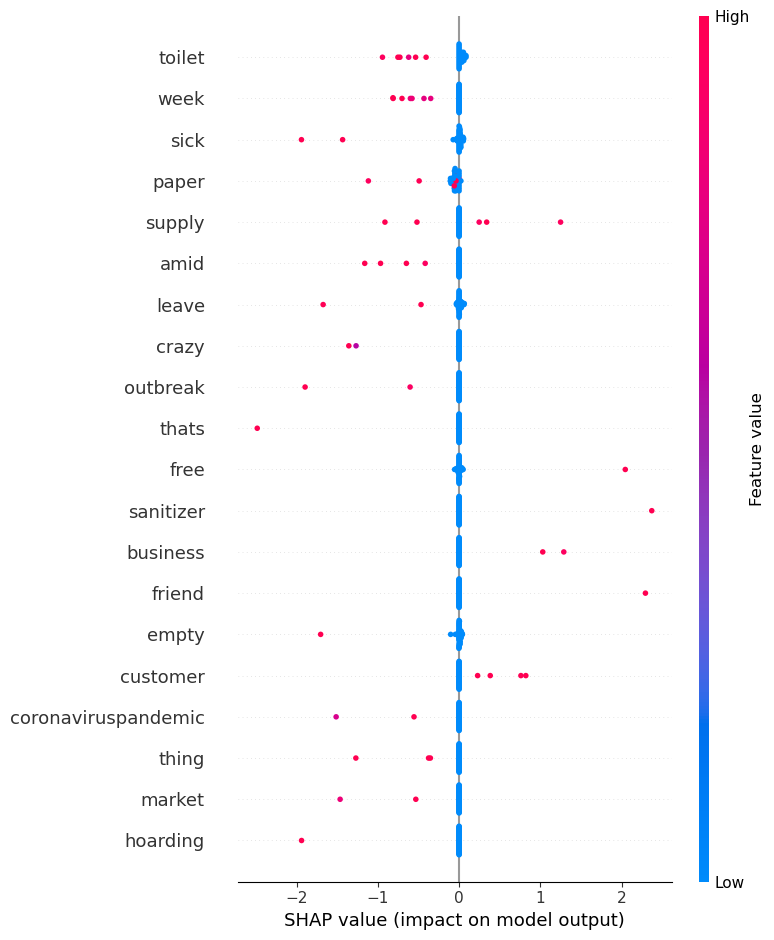

In [39]:
# Initialize a Tfidf vectorizer with lowercase set to false
vectorizer = TfidfVectorizer(lowercase=False)
# fit the vectorizer to the train data and transform the train and test data
X_train_nlp_fit = vectorizer.fit_transform(X_train_nlp)
X_test_nlp_fit = vectorizer.transform(X_test_nlp)

X_test_nlp_samp_df = pd.DataFrame(shap.sample(X_test_nlp_fit, 50).todense())
x_summary = shap.kmeans(np.asarray(X_train_nlp_fit.todense()), 10)
shap_lgb_explainer = shap.KernelExplainer(lgb_mdl.predict, x_summary)

shap_lgb_values_test = shap_lgb_explainer.shap_values(X_test_nlp_samp_df,        # l1_reg controls the level of L1 regularization to limit the number of features kept. Here, it specifies to keep only 20 features.
                                            l1_reg="num_features(20)")
shap.summary_plot(shap_lgb_values_test, X_test_nlp_samp_df,
            plot_type="dot", feature_names=vectorizer.get_feature_names_out())

In [92]:
print(shap.sample(X_test_nlp, 50).to_list()[39])
display(df_test[df_test['text_clean']== shap.sample(X_test_nlp, 100).to_list()[39]])
shap.initjs()
shap.force_plot(shap_lgb_explainer.expected_value, shap_lgb_values_test[39,:],
                X_test_nlp_samp_df.iloc[39,:], feature_names=vectorizer.get_feature_names_out())

ppl want normal evening want queue bread corn zombie apocalypse long life milk tin fishcoronavirus panickbuyinguk panicbuyinguk


,OriginalTweet,Sentiment,text_clean,text_len,token_lens,sentiment
1832,"Please ppl, I just want to do my normal evenin...",Positive,ppl want normal evening want queue bread corn ...,17,30,3


<font size="5" font color = 'Green'>**Comments:**

<font size="3" font color = 'Green'>1. Since its SHAP value for both 'want', "milk" and "life" are 0.3646, 0.2187 and 0.1906, the color of bar is red which indicates that it contributes positively to the model's output.

<font size="3" font color = 'Green'>2. Since their SHAP values for 'long' and 'queue' are 0.2363 and the bars are blue, indicating negative impact on the model's prediction. The "paper" and "medicaid" indicate don't contribute too much having value of 0. Also the <font size="3" font color = 'Red'>**red bar are longer** <font size="3" font color = 'Green'>than the blue bar, it suggests that words in red have greater impact on the model's output, **f(x)=3.0** means SHAP predict this tweet as Positive which actually was labeled as Positive.

In [85]:
print(shap.sample(X_test_nlp, 100).to_list()[17])
display(df_test[df_test['text_clean']== shap.sample(X_test_nlp, 100).to_list()[17]])
shap.initjs()
shap.force_plot(shap_lgb_explainer.expected_value, shap_lgb_values_test[17,:],
                X_test_nlp_samp_df.iloc[17,:], feature_names=vectorizer.get_feature_names_out())

micheleneggen retailcounter side customer havent really crazy virus sometimes use head crazy supply


,OriginalTweet,Sentiment,text_clean,text_len,token_lens,sentiment
291,@micheleneggen I work in the retail/counter si...,Extremely Positive,micheleneggen retailcounter side customer have...,13,22,4


<font size="5" font color = 'Green'>**Comments:**

<font size="3" font color = 'Green'>1. Since its SHAP value for "havent", "customer" are 0.3165 and "0.2696" separately. the color of bar is red which indicates that it contributes positively but didn't contribute too much to the model's output.**

<font size="3" font color = 'Green'>2. Since their SHAP values for 'crazy', "really", "supply" are 0.5766, 0.2617, 0.2138 separately, and the color of bars are blue, indicating negative impact on the model's prediction. Also the <font size="3" font color = 'Blue'>**blue bar are longer** <font size="3" font color = 'Green'>than the red bar, and the **f(x) = 1.0** shows this tweet should be **Negative** which was labeled Extremelt Positive actually.

<font size="5" font color = 'Green'>**Conclusions:**

<font size="3" font color = 'Green'>LIME and SHAP can provide insights into why a particular model makes certain predictions. They are not classifiers themselves but rather tools for understanding and interpreting the behavior of machine learning models.

<font size="3" font color = 'Green'>However, the discrepancies between the explanations provided by LIME and SHAP and the actual classifications made by the model can arise due to several reasons:

<font size="3" font color = 'Green'>1. Local Interpretability: The explanations provided by LIME and SHAP may not always accurately reflect the global behavior of the model, especially if the local neighborhood is not representative of the overall dataset distribution.

<font size="3" font color = 'Green'>2. Complexity of the Model: If the sentiment analysis model is highly complex or non-linear, LIME and SHAP may struggle to provide accurate local approximations. In our case, the explanations may not fully capture the underlying decision boundaries of the model, leading to discrepancies between the explanations and the actual predictions.

<font size="3" font color = 'Green'>3. Feature Importance vs. Contribution: LIME and SHAP may highlight features or words that are important for the prediction but not necessarily indicative of the true sentiment. The model may rely on certain features that correlate with sentiment but do not directly represent it, leading to misinterpretations by the explanation techniques.